In [1]:
# ! pip install numpy matplotlib rasterio dotenv

# ! pip freeze > ../requirements.txt

In [1]:
import os
import re
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from dotenv import load_dotenv

# Load Evnvironment

In [2]:
load_dotenv(".env")

ROOT_DATA_DIR = os.getenv("ROOT_DATA_DIR")
LANDCOVER_DIR = os.getenv("LANDCOVER_DIR")

SCALE_FACTOR = int(os.getenv("SCALE_FACTOR"))

# Constants

In [3]:
# get path to landcover files
base_landcover_path = f"{ROOT_DATA_DIR}{os.sep}{LANDCOVER_DIR}"
LANDCOVER_FILES = os.listdir(base_landcover_path)
LANDCOVER_FILES = [f"{base_landcover_path}{os.sep}{file}" for file in LANDCOVER_FILES]

In [4]:
LANDCOVER_LABELS = {
    0: "Not Canada",
    1: "Temperate or Sub-Polar Needleleaf Forest",
    2: "Sub-Polar Taiga Needleleaf Forest",
    3: "3 - No Name Yet",
    4: "4 - No Name Yet",
    5: "Temperate or Sub-Polar Broadleaf Deciduous Forest",
    6: "Mixed Forest",
    7: "7 - No Name Yet",
    8: "Temperate or Sub-Polar Shrubland",
    9: "9 - No Name Yet",
    10: "Temperate or Sub-Polar Grassland",
    11: "Sub-Polar or Polar Shrubland-Lichen-Moss",
    12: "Sub-Polar orPolar Grassland-Lichen-Moss",
    13: "Sub-Polar or Polar Barren-Lichen-Moss",
    14: "Wetland",
    15: "Cropland",
    16: "Barren Land",
    17: "Urban building",
    18: "Water",
    19: "Snow and Ice"
}

In [5]:
LANDCOVER_COLORS = {
    0:"#FFFFFF00",
    1:"#1B5E20", 
    2:"#689F38", 
    3:"#9CCC65", 
    4:"#C5E1A5", 
    5:"#66BB6A", 
    6:"#004D40", 
    7:"#A5D6A7", 
    8: "#808000",
    9:"#005000", 
    10:"#2E7D32", 
    11:"#00897B", 
    12:"#004D40", 
    13:"#B2DFDB", 
    14:"#4DB6AC", 
    15:"#795548", 
    16:"#808080", 
    17:"#000000", 
    18:"#000080", 
    19:"#D0D0F0"
}

# Helper Functions

In [6]:
def get_year(file:str):
    year_re = r'landcover-(\d{4})-classification'
    year = re.search(year_re, file).group(1)
    del year_re
    return year

In [7]:
def get_landcover_data(
    file:str,
    scale_factor:int = SCALE_FACTOR
):
    with rasterio.open(file) as landcover_tif:
        print(f"Reading {file}...")

        # keep track of crs
        crs = landcover_tif.crs
        print(f"CRS: {landcover_tif.crs}")
        del crs

        # read file 
        landcover_data = landcover_tif.read(1) # reading channel 1 as there is only one band
        del landcover_tif

        # down scale for plotting
        print(f"Original Size: {landcover_data.shape}")
        if scale_factor < 1:
            raise ValueError("scale_factor can not be less than 1!!!")
        elif scale_factor > 1:
            landcover_data = landcover_data[::scale_factor, ::scale_factor]
        else:
            print("Skipping scaling")
        print(f"Downscale size: {landcover_data.shape}")

    return landcover_data

In [8]:
def get_legend_patches(
    label_dict:dict = LANDCOVER_LABELS,
    color_dict:dict = LANDCOVER_COLORS,
):
    # build patches
    legend_pathches = []
    for landcover_id in label_dict:
        # skip if label is not canada
        if landcover_id == 0:
            continue
        # skip the label if not useful
        if label_dict[landcover_id].endswith("No Name Yet"):
            continue

        # get curr size of list
        curr_index = len(legend_pathches) + 1

        # build and add the legend pathc tile
        patch = mpatches.Patch(
            color = color_dict[landcover_id],
            label = f"{landcover_id} - {label_dict[landcover_id]}"
        )
        del curr_index
        legend_pathches.append(patch)
        del patch
    
    return legend_pathches

In [9]:
def plot_legend(
    color_dict:dict = LANDCOVER_COLORS,
    label_dict:dict = LANDCOVER_LABELS,
    legend_num_col:int = 3,
    legend_font_size:int = 15,
    legend_anchor:tuple = (0.5, -0.0),
    legend_loction:str = "upper center" 
):
    # genetrate legend
    patches = get_legend_patches(
        label_dict = label_dict,
        color_dict = color_dict, 
    )
    plt.legend(
        title = "Landcover Type",
        frameon = True,
        handles = patches, 
        loc = legend_loction, 
        bbox_to_anchor = legend_anchor,
        title_fontsize = legend_font_size + 5,
        fontsize = legend_font_size, 
        ncol = legend_num_col,
    )
    del patches

In [10]:
def plot_landcover(
    landcover_data,
    fig_loc:str = None,
    title:str = None,
    figsize:tuple = (30, 30),
    cmap:str = None,
    color_dict:dict = LANDCOVER_COLORS,
    label_dict:dict = LANDCOVER_LABELS,
    is_axis:bool = False,
    is_legend:bool = False,
    legend_num_col:int = 3,
    legend_font_size:int = 15,
    legend_anchor:tuple = (0.5, -0.0),
    legend_loction:str = "upper center" 
):
    plt.figure(
        figsize = figsize
    )

    # generate the color map 
    cmap = mcolors.ListedColormap(color_dict.values())

    # plot image
    plt.imshow(
        X = landcover_data,
        cmap = cmap
    )
    del cmap

    # axis off
    if not is_axis:
        plt.axis('off')
    
    # save the figure
    if fig_loc is not None:
        plt.savefig(
            fig_loc, 
            transparent = True,
            bbox_inches = 'tight', # compress the content  
            pad_inches = 0, # have no extra margin
        )
    # add title
    plt.title(title)

    # plot legend
    if is_legend == True:
        plot_legend(
            color_dict = color_dict,
            label_dict = label_dict,
            legend_num_col = legend_num_col,
            legend_font_size = legend_font_size,
            legend_anchor = legend_anchor,
            legend_loction = legend_anchor,
        )

    # show image
    plt.show()


# Visulization

Reading ../../data/land_cover/landcover-2010-classification.tif...
CRS: EPSG:3979


Original Size: (160001, 190001)
Downscale size: (16001, 19001)


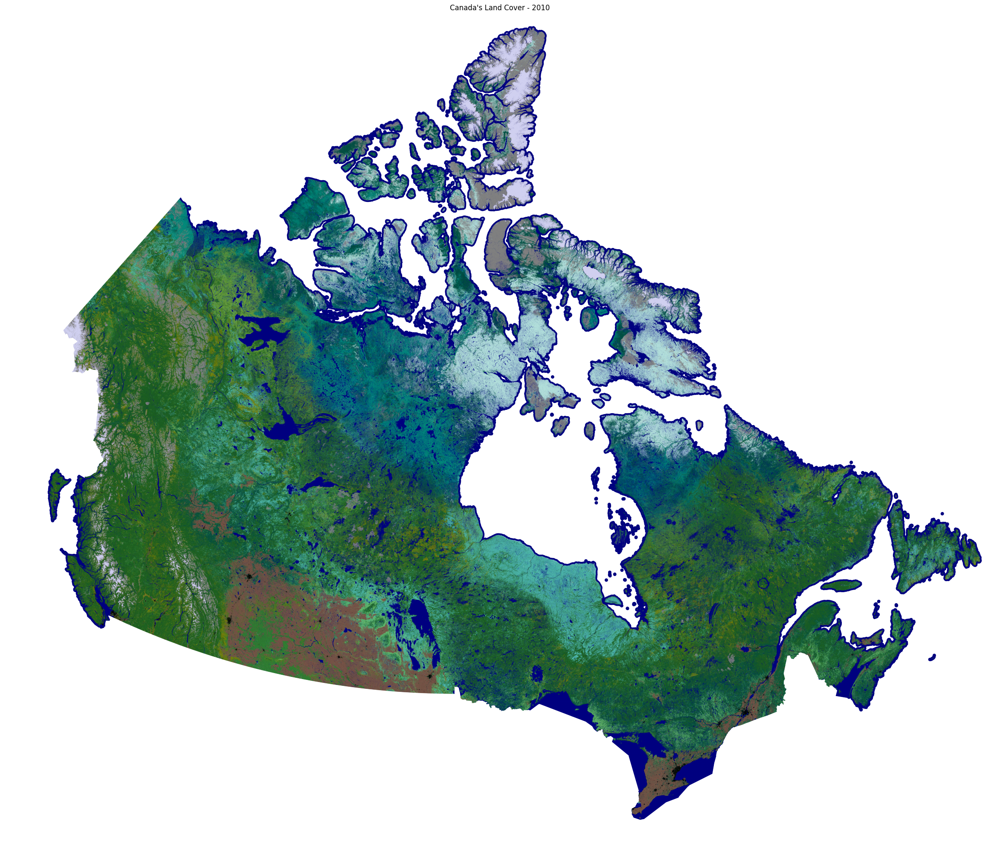

Reading ../../data/land_cover/landcover-2015-classification.tif...
CRS: EPSG:3979
Original Size: (160001, 190001)
Downscale size: (16001, 19001)


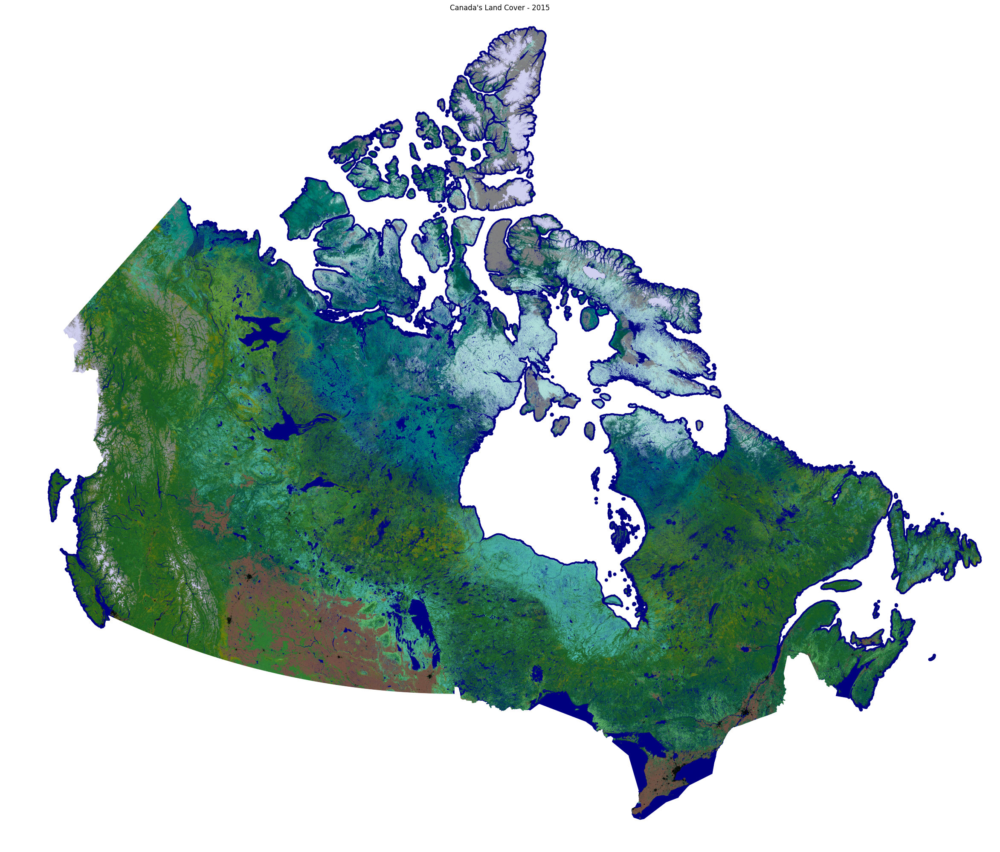

Reading ../../data/land_cover/landcover-2020-classification.tif...
CRS: EPSG:3979
Original Size: (160001, 190001)
Downscale size: (16001, 19001)


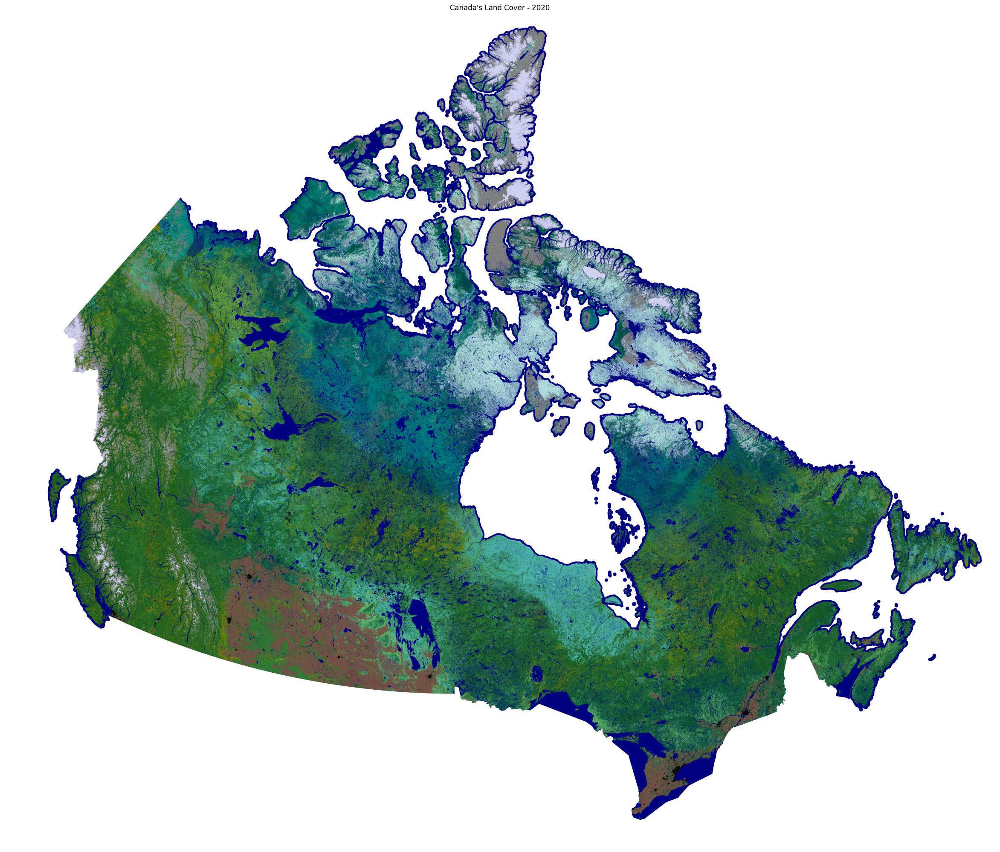

In [12]:
for landcover_file in LANDCOVER_FILES:
    landcover_year = get_year(landcover_file)

    landcover_data = get_landcover_data(
        file = landcover_file,
        scale_factor = SCALE_FACTOR, # 10
    )
    
    plot_landcover(
        landcover_data = landcover_data,
        title = f"Canada's Land Cover - {landcover_year}",
        fig_loc = f"../assets/figures/landcover_canada_{landcover_year}.png"
    )

    del landcover_data
    del landcover_year

## Plot Legend

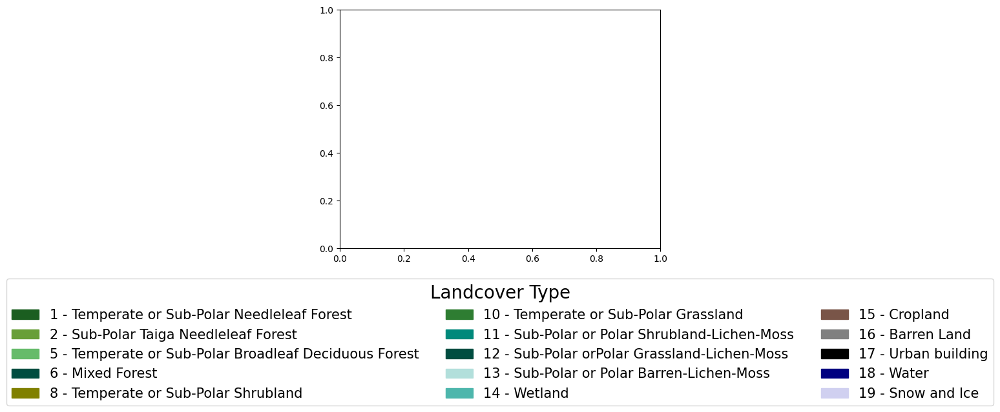

In [11]:
plot_legend(
    legend_anchor = (0.5, -0.1)
)
plt.savefig(
    f"../assets/figures/landcover_canada_legend.png", 
    transparent = True,
    bbox_inches = 'tight', # compress the content  
    pad_inches = 0, # have no extra margin
)
plt.show()